# Import libraries

In [178]:
import os
import gc
import re

import cv2
import math
import numpy as np
import scipy as sp
import pandas as pd
import json
import seaborn as sn
import albumentations as A

from IPython.display import SVG
from keras.utils import plot_model
from kaggle_datasets import KaggleDatasets

import seaborn as sns
from tqdm import tqdm
import matplotlib.cm as cm
import matplotlib.pyplot as plt

tqdm.pandas()
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

np.random.seed(0)

import warnings
warnings.filterwarnings("ignore")

In [179]:
train = pd.read_csv('../input/cassava-leaf-disease-classification/train.csv')
train = train[:1000]

In [180]:
def get_img(path):
    im_bgr = cv2.imread('../input/cassava-leaf-disease-classification/train_images/'+path)
    im_rgb = im_bgr[:, :, ::-1]
    return im_rgb

In [181]:
img_list = []

def get_imgs():
    for img in train['image_id']:
        img_list.append(get_img(img))
        
get_imgs()

In [182]:
label_list = []

def get_targets():
    for label in train['label']:
        label_list.append(label)
        
get_targets()

# Distribution of classes

What are our classes?

In [183]:
with open(os.path.join("../input/cassava-leaf-disease-classification/label_num_to_disease_map.json")) as file:
    map_classes = json.loads(file.read())
    map_classes = {int(k) : v for k, v in map_classes.items()}
    
print(json.dumps(map_classes, indent=4))

{
    "0": "Cassava Bacterial Blight (CBB)",
    "1": "Cassava Brown Streak Disease (CBSD)",
    "2": "Cassava Green Mottle (CGM)",
    "3": "Cassava Mosaic Disease (CMD)",
    "4": "Healthy"
}


In [184]:
train = pd.read_csv(os.path.join("../input/cassava-leaf-disease-classification/train.csv"))

train["class_name"] = train["label"].map(map_classes)

train

,image_id,label,class_name
0,1000015157.jpg,0,Cassava Bacterial Blight (CBB)
1,1000201771.jpg,3,Cassava Mosaic Disease (CMD)
2,100042118.jpg,1,Cassava Brown Streak Disease (CBSD)
3,1000723321.jpg,1,Cassava Brown Streak Disease (CBSD)
4,1000812911.jpg,3,Cassava Mosaic Disease (CMD)
...,...,...,...
21392,999068805.jpg,3,Cassava Mosaic Disease (CMD)
21393,999329392.jpg,3,Cassava Mosaic Disease (CMD)
21394,999474432.jpg,1,Cassava Brown Streak Disease (CBSD)
21395,999616605.jpg,4,Healthy


<AxesSubplot:xlabel='count', ylabel='class_name'>

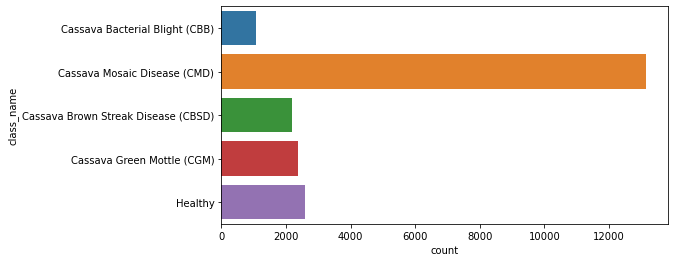

In [185]:
plt.figure(figsize=(8, 4))
sn.countplot(y="class_name", data=train)

# General Visualization

It's improtant to lay the foundation in regards to what our data represents so that we can figure out how best to go about creating our model. If we lack all knowledge of what it is we are working with, then it would be extra difficult to create a model that understands what it is we are working with. Therefore, we believe it benefical to take a look into the description of the diseases as well as how it is they manifest.

In [186]:
def visualize_batch(image_ids, labels):
    plt.figure(figsize=(16, 12))
    
    for ind, (image_id, label) in enumerate(zip(image_ids, labels)):
        plt.subplot(3, 3, ind + 1)
        image = cv2.imread(os.path.join("../input/cassava-leaf-disease-classification/train_images", image_id))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        plt.imshow(image)
        plt.title(f"Class: {label}", fontsize=12)
        plt.axis("off")
    
    plt.show()

# 0 - CBB - Cassava Bacterial Blight

**Description of Disease**

Cassva Bacterial Blight is a vascular and foliar pathogenic species of bacteria. It normally enters its host plants through stomatal openings or hydathodes. Wounds to stems have also been noted as a means of entry[11]. Among diseases which afflict cassava worldwide, bacterial blight causes the largest losses in terms of yield[10]. Once one cassava plant is infected, the whole crop is put at risk to infection by rainsplash, contaminated cultivation tools, and foot traffic[12].

**Detection & Inspection**

First, look to see if leaves are drying and dying early[5].  Symptoms include blight, wilting, dieback, and vascular necrosis[19].

Total train images for class 0: 1087


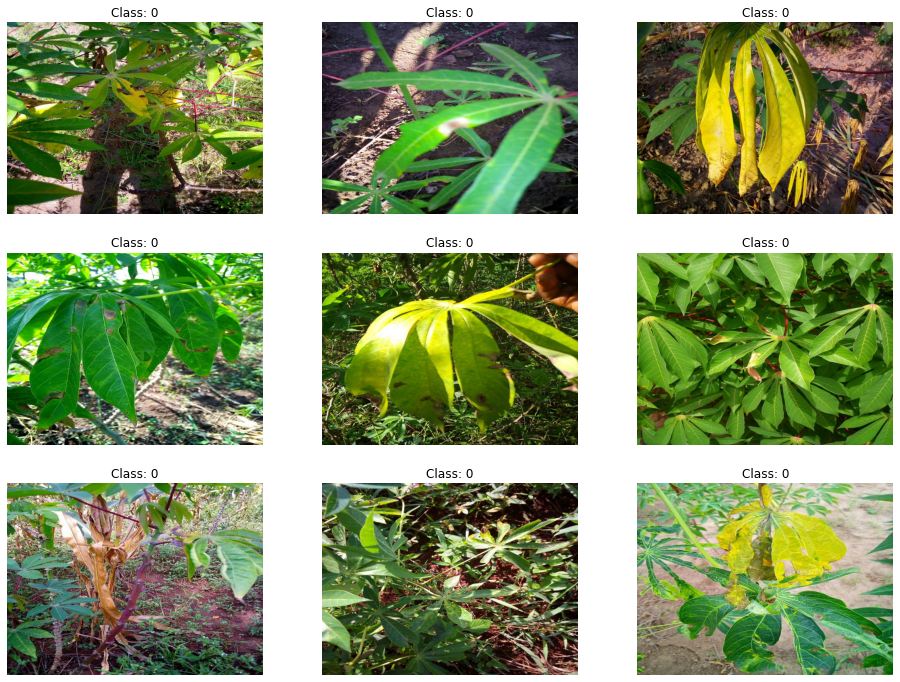

In [187]:
tmp_df = train[train["label"] == 0]
print(f"Total train images for class 0: {tmp_df.shape[0]}")

tmp_df = tmp_df[:9]
image_ids = tmp_df["image_id"].values
labels = tmp_df["label"].values

visualize_batch(image_ids, labels)


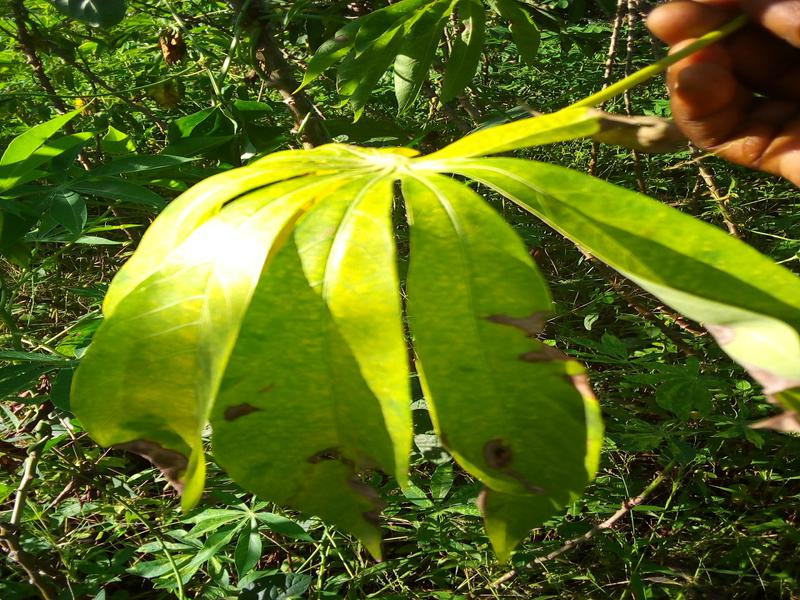

In [188]:
tmp_img = get_img(tmp_df['image_id'].iloc[4])
fig = px.imshow(tmp_img)
fig.show()

I really like this image because it is a clear picture of the symptoms of CBB. When hovering over the pixels representing tissue that is infected with the disease we can see the Green channel value drops significantly while the blue channel tends to rise.  

# 1 - CBSD - Cassava Brown Streak Disease

**Description of Disease**

CBSD is a member of the Potyviridae family of viruses, meaning it is a postive-strand RNA virus[18]. After a period of ambiguity among researchers, the consensus is that the most likely candidate of CBSD vector is the silverleaf whitefly[14]. 

<center><img src="<p><a href="https://commons.wikimedia.org/wiki/File:Silverleaf_whitefly.jpg#/media/File:Silverleaf_whitefly.jpg"><img src="https://upload.wikimedia.org/wikipedia/commons/a/a7/Silverleaf_whitefly.jpg" alt="Silverleaf whitefly.jpg"></a><br>Public Domain, <a href="https://commons.wikimedia.org/w/index.php?curid=771997">Link</a></p>"></center>
<br>

It was first identified in 1936 in Tanzania, and has spread to other coastal areas of East Africa, from Kenya to Mozambique. This particular disease is considered to be the biggest threat to food security in coastal East Africa and around the eastern lakes[13].

**Detection & Inspection**

CBSD is characterized by severe chlorosis and necrosis on infected leaves, giving them a yellowish, mottled appearance[6]. Chlorophyll is responsible for the green color of leaves, chlorotic leaves are pale, yellow, or yellow-white[7]. Necrosis causes leaves, stems and other parts to darken and wilt[8].

Total train images for class 1: 2189


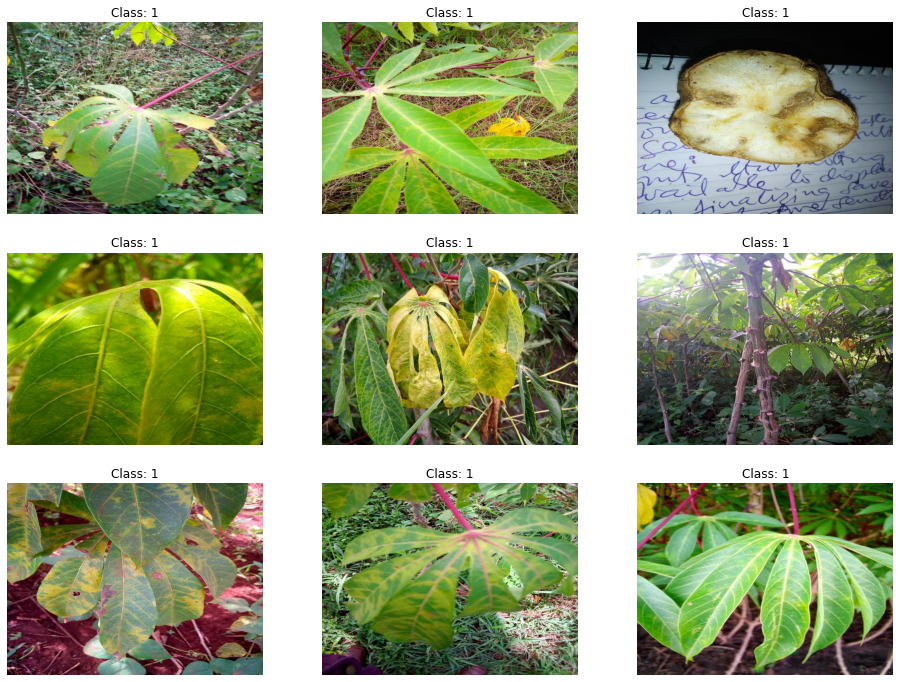

In [189]:
tmp_df = train[train["label"] == 1]
print(f"Total train images for class 1: {tmp_df.shape[0]}")

tmp_df = tmp_df[10:19]
image_ids = tmp_df["image_id"].values
labels = tmp_df["label"].values

visualize_batch(image_ids, labels)


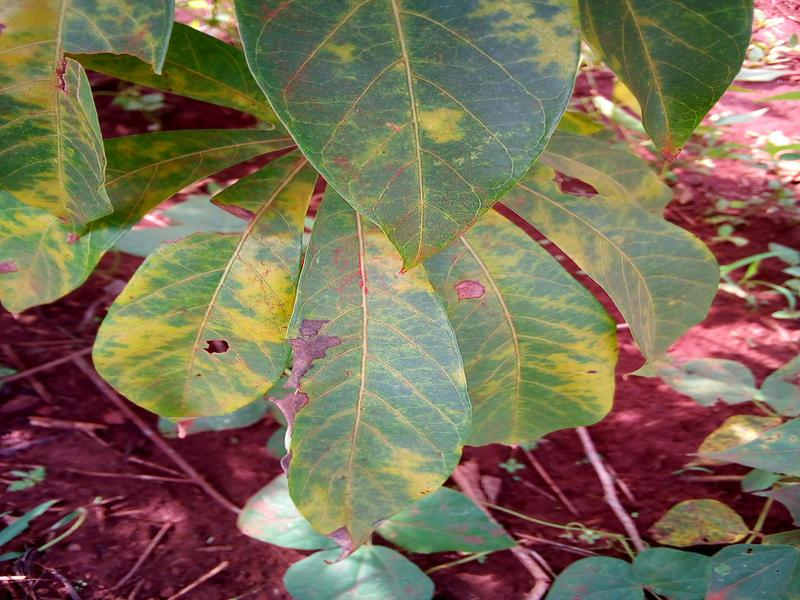

In [190]:
tmp_img = get_img(tmp_df['image_id'].iloc[6])
fig = px.imshow(tmp_img)
fig.show()

I like this image because it shows how CBSD results in these discolored splotches. We can see how the diseased parts of the leaf has the blue channel drop while the red and green channels raise.

# 2 - CGM - Cassava Green Mottle

**Description of Disease**

CGM, also known as Cassava green mottle nepovirus, is a plant pathogenic virus. It is transmitted by nematodes - hence the name[4].

<center><img src="<p><a href="https://commons.wikimedia.org/wiki/File:Silverleaf_whitefly.jpg#/media/File:Silverleaf_whitefly.jpg"><img src=<p><a href="https://commons.wikimedia.org/wiki/File:CelegansGoldsteinLabUNC.jpg#/media/File:CelegansGoldsteinLabUNC.jpg"><img src="https://upload.wikimedia.org/wikipedia/commons/6/6a/CelegansGoldsteinLabUNC.jpg" alt="CelegansGoldsteinLabUNC.jpg"></a><br>By Bob Goldstein, UNC Chapel Hill [15]" </center>
<br>

**Detection & Inspection**


CGM creates yellow patterns on the leaves, from small dots to irregular patches of yellow and green. Leaf margins are also distorted. As well, the plants may be stunted[4].

Total train images for class 2: 2386


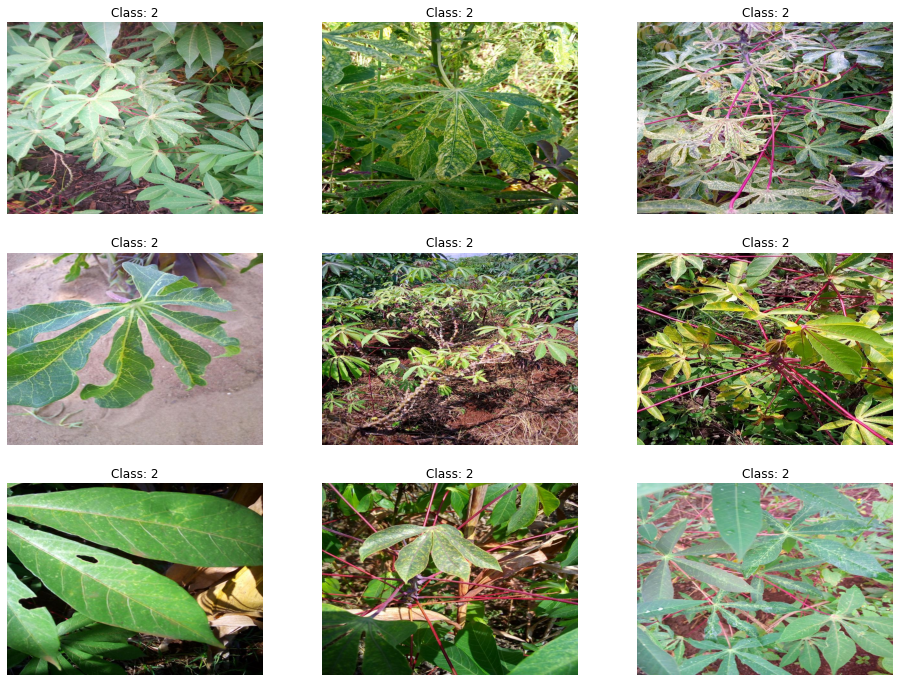

In [191]:
tmp_df = train[train["label"] == 2]
print(f"Total train images for class 2: {tmp_df.shape[0]}")

tmp_df = tmp_df[:9]
image_ids = tmp_df["image_id"].values
labels = tmp_df["label"].values

visualize_batch(image_ids, labels)


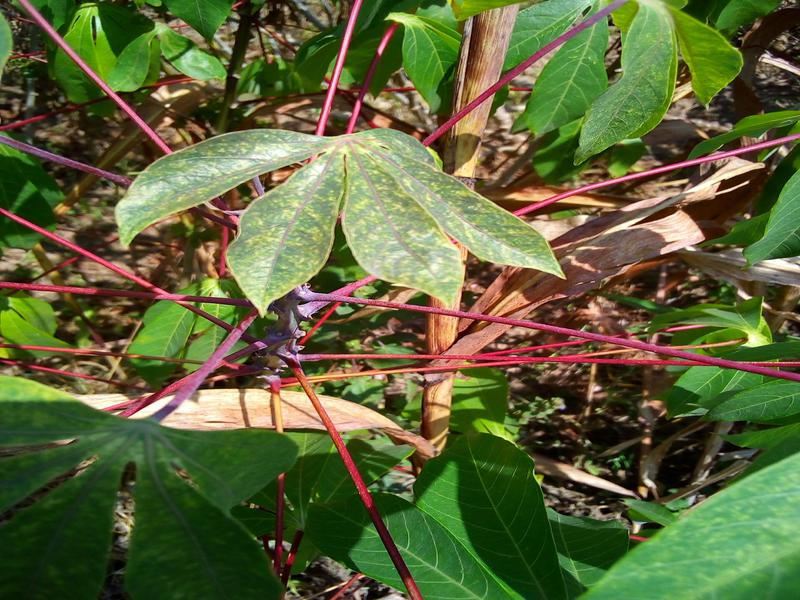

In [192]:
tmp_img = get_img(tmp_df['image_id'].iloc[7])
fig = px.imshow(tmp_img)
fig.show()

This image shows how plants infected with CGM also experiance similar symptoms to our previous example, CBSD. But while CBSD manifested in large discolored splotches on the infected the leaf, CGM leads to a more paint-splatter effect of discoloration. This difference, between the splotches and splatters, could be something to keep in mind when fine-tuning our model.

# 3 - CMD - Cassava Mosaic Disease

**Description of Disease**

Cassava Mosaic Virus is the common name used to refer to any of eleven different species of plant pathogenic viruses in the family of viruses known as Geminiviridae [15]. Geminiviridae viruses are viruses that encode their genetic information on a circular genome of single-stranded DNA [16]. These diseases are also spread by the dreaded silverleaf whitefly [17].

**Detection & Inspection**

CMD produces a variety of foliar symptoms that include yellow, white or green stripes/streaks/spots on foliage. As well, symptoms include wrinkled, curled or small leaves, as well as stunted growth and reduced yields[9].

Total train images for class 3: 13158


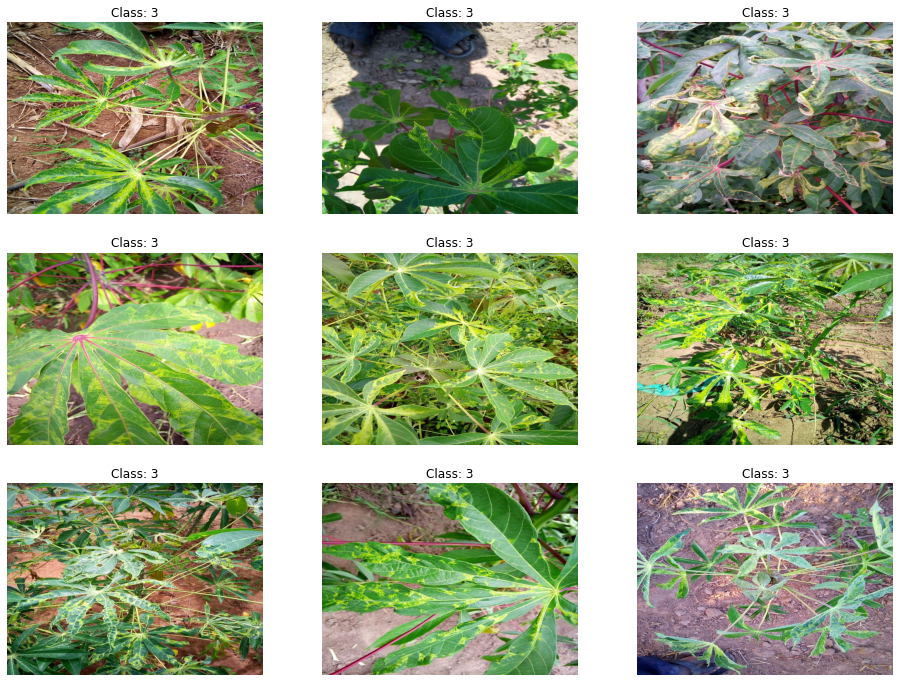

In [193]:
tmp_df = train[train["label"] == 3]
print(f"Total train images for class 3: {tmp_df.shape[0]}")

tmp_df = tmp_df[:9]
image_ids = tmp_df["image_id"].values
labels = tmp_df["label"].values

visualize_batch(image_ids, labels)


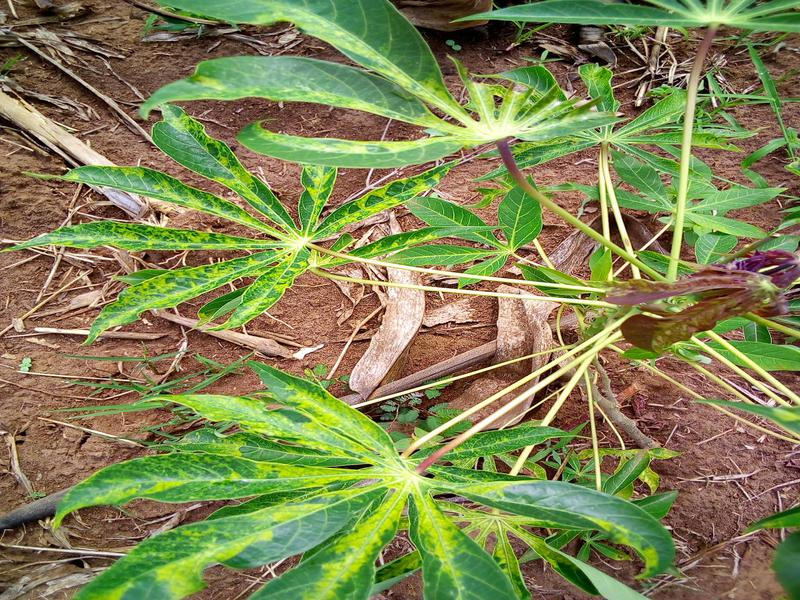

In [194]:
tmp_img = get_img(tmp_df['image_id'].iloc[0])
fig = px.imshow(tmp_img)
fig.show()

Once again we have a disease that presents itself with the symptom of discoloration. Yet once again it differs slightly as this discoloration appears more in the form of streaks. As well, we can see the curling of leaves being presented.

# 4 - Healthy

A healthy cassava leaf would, as is intuitive, not be showing any of these symptoms that we have been looking at so far. They still can be yellow or dying, just as any plant may exhibit oddities for a multitude of reasons, but they would not show any of the aforementioned extraordinary symptoms.

Total train images for class 4: 2577


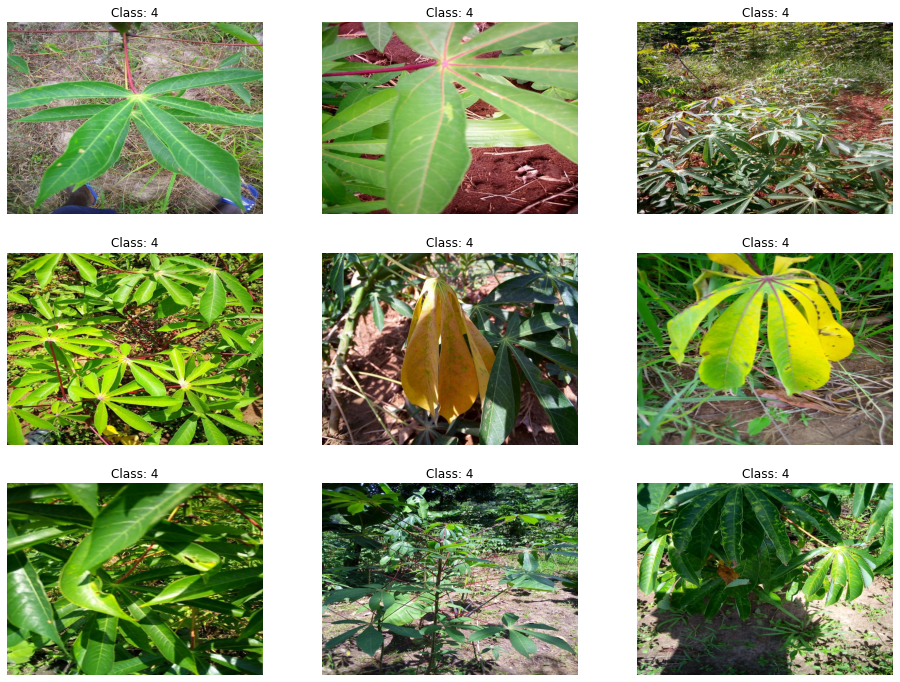

In [195]:
tmp_df = train[train["label"] == 4]
print(f"Total train images for class 4: {tmp_df.shape[0]}")

tmp_df = tmp_df[10:19]
image_ids = tmp_df["image_id"].values
labels = tmp_df["label"].values

visualize_batch(image_ids, labels)


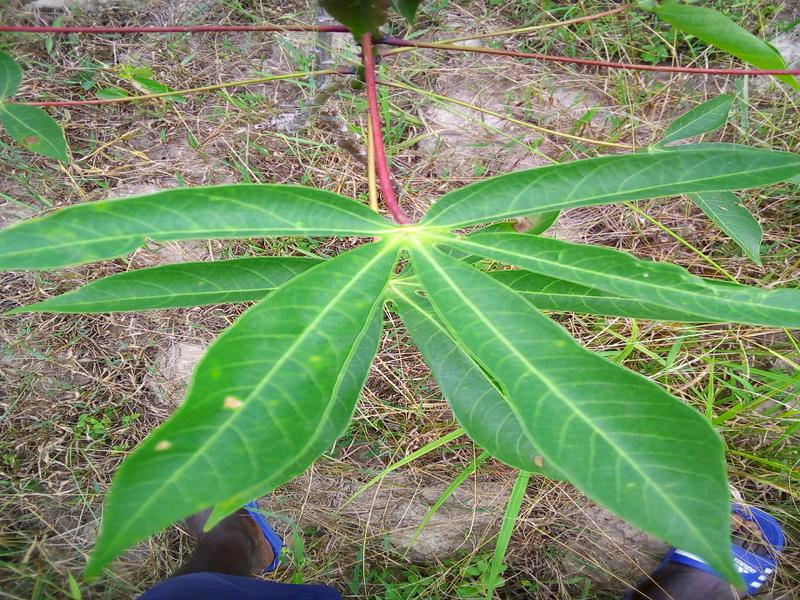

In [196]:
tmp_img = get_img(tmp_df['image_id'].iloc[0])
fig = px.imshow(tmp_img)
fig.show()

This leaf may have some slight yellowing, but some damage is to be expected. Leaves are still living things that may bruise or wilt for reasons other than disease. As well, we can see a healthy root.

# Channel Distributions

As these pictures are essentially vectors of RGB values, looking at the distribution of these values will provide us valuable insight into the data. 

In [197]:
red_values = [np.mean(img_list[idx][:, :, 0]) for idx in range(len(img_list))]
green_values = [np.mean(img_list[idx][:, :, 1]) for idx in range(len(img_list))]
blue_values = [np.mean(img_list[idx][:, :, 2]) for idx in range(len(img_list))]
values = [np.mean(img_list[idx]) for idx in range(len(img_list))]

 **Channel Values**

In [198]:
fig = ff.create_distplot([values], group_labels=["Channels"], colors=['purple'])
fig.update_layout(showlegend=False, template="simple_white")
fig.update_layout(title_text="Distribution of channel values")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig

This is a distribution of the average value for each pixel within an image. We can think of this as the distributions of these images if they were greyscaled. Another persepective could be that this is an insight into how bright pixels are in the images. 

In [199]:
fig = ff.create_distplot([red_values], group_labels=["R"], colors=["red"])
fig.update_layout(showlegend=False, template="simple_white")
fig.update_layout(title_text="Distribution of red channel values")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig

We have established, as a single example, that the red channel is useful in helping distingusigh between yellowing leaves. The model can look for outliers to identify when abnormal discoloration is occuring. The red channel shows a near normal distribution with a peak that hovers around a value of 106. 

In [200]:
fig = ff.create_distplot([green_values], group_labels=["G"], colors=["green"])
fig.update_layout(showlegend=False, template="simple_white")
fig.update_layout(title_text="Distribution of green channel values")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig

This shows a distribution of the green values in our images. We can see that the images in our dataset tend to have a higher green value than red values and that there exists two peaks, with the higher peak being around a value of 138. Is there a significant reason for two peaks? Potentially a question our model can deduce.

In [201]:
fig = ff.create_distplot([blue_values], group_labels=["B"], colors=["blue"])
fig.update_layout(showlegend=False, template="simple_white")
fig.update_layout(title_text="Distribution of blue channel values")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig

The blue channel increases quickly and then tapers off. This shows us that the blue channel of the RGB trifecta is the one with the least amount of representation within the individual vectors of the  dataset. We know that the blue value very much helps us identify necrotic tissue, definetly something to be aware of.

In [202]:
fig = ff.create_distplot([red_values, green_values, blue_values],
                         group_labels=["R", "G", "B"],
                         colors=["red", "green", "blue"])
fig.update_layout(title_text="Distribution of all channel values", template="simple_white")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig.data[1].marker.line.color = 'rgb(0, 0, 0)'
fig.data[1].marker.line.width = 0.5
fig.data[2].marker.line.color = 'rgb(0, 0, 0)'
fig.data[2].marker.line.width = 0.5
fig

By plotting all the distributions against each other, we can see how the green channel is the most commonly activated of all the colors, while blue is much less prevalent. Are the green channels too noisy? Are the blue channels too varied? Is there more value in any specific channel? All questions to ask ourselves as we go about making tuning our model and augmenting the images.

# Sources

**Kaggle Notebooks that inspired code and layout, big props to Tarun Paparaju and Yaroslav Isaienkov!**

https://www.kaggle.com/tarunpaparaju/plant-pathology-2020-eda-models

https://www.kaggle.com/ihelon/cassava-leaf-disease-exploratory-data-analysis

**Informational Sources**

[3] https://github.com/albumentations-team/albumentations

[4] https://www.pestnet.org/fact_sheets/cassava_green_mottle_068.htm

[5] https://www.pestnet.org/fact_sheets/cassava_bacterial_blight_173.htm

[6] Winter, S.; Koerbler, M.; Stein, B.; Pietruszka, A.; Paape, M.; Butgereitt, A. (13 January 2010). "Analysis of cassava brown streak viruses reveals the presence of distinct virus species causing cassava brown streak disease in East Africa". Journal of General Virology. 91 (5): 1365–1372. doi:10.1099/vir.0.014688-0. PMID 20071490.

[7] Kubis S, Patel R, Combe J, et al. (August 2004). "Functional specialization amongst the Arabidopsis Toc159 family of chloroplast protein import receptors". Plant Cell. 16 (8): 2059–77. doi:10.1105/tpc.104.023309. PMC 519198. PMID 15273297.

[8] https://sciencing.com/disadvantages-fungi-8714000.html

[9] https://www.planetnatural.com/pest-problem-solver/plant-disease/mosaic-virus/

[10] http://www.apsnet.org/publications/PlantDisease/BackIssues/Documents/1986Articles/PlantDisease70n12_1089.PDF

[11] "Cassava bacterial blight (Xanthomonas axonopodis pv. Manihotis)". http://www.plantwise.org/KnowledgeBank/Datasheet.aspx?dsid=56952

[12] http://www.adap.hawaii.edu/adap/Publications/ADAP_pubs/2000-1.pdf

[13] Mohammed, I. U.; Abarshi, M. M.; Muli, B.; Hillocks, R. J.; Maruthi, M. N. (1 January 2012). "The Symptom and Genetic Diversity of Cassava Brown Streak Viruses Infecting Cassava in East Africa". Advances in Virology. 2012: 795697. doi:10.1155/2012/795697. PMC 3290829. PMID 22454639.

[14]Alicai, T.; Omongo, C. A.; Maruthi, M. N.; Hillocks, R. J.; Baguma, Y.; Kawuki, R.; Bua, A.; Otim-Nape, G. W.; Colvin, J. (1 January 2007). "Re-emergence of Cassava Brown Streak Disease in Uganda". Plant Disease. 91 (1): 24–29. doi:10.1094/PD-91-0024. PMID 30781061.

[15] Patil B & Fauquet C (2009). Cassava mosaic geminiviruses: actual knowledge and perspectives. Molecular Plant Pathology. 10: 685–701.

[16] Zerbini, FM; Briddon, RW; Idris, A; Martin, DP; Moriones, E; Navas-Castillo, J; Rivera-Bustamante, R; Roumagnac, P; Varsani, A; ICTV Report Consortium (February 2017). "ICTV Virus Taxonomy Profile: Geminiviridae". The Journal of General Virology. 98 (2): 131–133. doi:10.1099/jgv.0.000738. PMC 5802298. PMID 28284245.

[17] Timmermans, M.C.P., Das, O.P., Messing, J. (1994). Geminivurses and Their Uses as Extrachromosomal Replicons. Annu. Rev. Plant Physiol. Plant Mol. Biol. 45:79–112.

[18] Riechmann, JL; Lain, S; Garcia, JA (1992). "Highlights and prospects of potyvirus molecularbiology". J Gen Virol. 73: 1–16. doi:10.1099/0022-1317-73-1-1. PMID 1730931.

[19]http://www.apsnet.org/publications/PlantDisease/BackIssues/Documents/1986Articles/PlantDisease70n12_1089.PDF
